# Project 2 - MOD 510: Modeling and Computational Engineering

# MSc Computational Engineering

# Team : 

## MUHAMMAD USAMA - 261882

## ASIM SABIR - 261876

## 18 - OCT - 2020

### INTRODUCTON

In this project, we will get to work on linear regression, model input estimation, finite differencing and matrix formulation for a system of equations. We will also get to work with and understand different reservoir properties and understand their impact on each other. 

### EXERCISE 1

LETS INCLUDE ALL THE PACKAGES WE WILL BE NEEDING THROUGH OUT THIS EXERCISE

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math as m
from numpy.linalg import inv
from numpy.linalg import qr
import scipy
from scipy import special
from scipy.sparse import diags
from scipy.sparse import csc_matrix
from scipy.sparse.linalg import spsolve
from scipy import linalg
import timeit
from scipy.optimize import least_squares
from scipy.optimize import minimize

#### PART 1

The function below converts a .dat file to pandas data frame, and removes the tabs and skips the given number of rows as well. We will use it once here and then in exercise 4. 

In [8]:
def dat2pandas(file_name,n=4):
    """
    Input a .dat file_name and return a pandas data frame
    Input argument = File name
    Return type: Pandas data frame
    
    """
    import pandas as pd
    df = pd.read_csv(file_name,sep='\t',skiprows=n)
    return df

In [9]:
df1 = dat2pandas("perm_data.dat") # Calling the above defined function and storing result in "df1" 
arr1 = df1.to_numpy()             # Converting the dataframe to a numpy array name "arr1"
arr1                              # Lets prnt it out and see what we got

array([[0.1  , 0.396],
       [0.2  , 0.17 ],
       [0.3  , 0.72 ],
       [0.6  , 0.369],
       [1.   , 1.406],
       [1.5  , 2.318],
       [2.   , 8.   ]])

We can see the contents prnted above, now according to Darcy's LAW we have the expresson given below. 

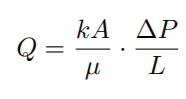

In [10]:
#Q = np.array([0.1,0.2,0.3,0.6,1,1.5,2])
#del_P=np.array([0.396,0.170,0.720,0.369,1.406,2.318,8.0])

#The above comments were values are hardcoded are just made for quick troubleshooting. 

Q = arr1[:,0]                # Extracting values of flowrates from arr1 numpy array.
 
del_P=arr1[:,1]              # Extracting values of DELTA P from arr1 numpy array.    

Lets scatter plot these results and see what we got.

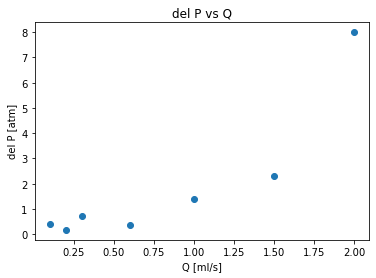

In [11]:
plt.scatter(Q, del_P)
plt.title('del P vs Q')
plt.xlabel('Q [ml/s]')
plt.ylabel('del P [atm]')
plt.show()

We can see the scatter plot above the last value seems to be an outlier, anyway now we will try to fit a linear regrssion model onto the given dataset in Part 2 below. 

#### Part 2

In [12]:
#Performing linear regression for estimation of k.  

#Q = np.array([0.1,0.2,0.3,0.6,1,1.5,2])
#del_P=np.array([0.396,0.170,0.720,0.369,1.406,2.318,8.0])

# The above lines are just commented for reference, they are not used below.  

#Now we will initialize the variables of Length (L),diameter(a) and vicosity (u). We will also calculate Area using pi*r**2

L = 7                     #(cm) Length of cylindrical core
d = 3.8                   #(cm) Diameter of cylindrical core
A = m.pi* ((d/2)**2)      # Cross sectional Area (πr2), n cm sq
u= 1                      # Viscocity in cP


#y is the dependent variable i.e delta P
y= del_P                

#We take every thing else to the other side, and define x as below.
x= ((L*Q*u)/A)

#We can express any general line here as, y=mx+c, where m is the slope and c is the y-intercept. 

#SLOPE here is equal to => b => 1/k 

#We will determine the slop here by the Lin_Reg function here, we can already see that, "c (y-intercept)" as at x=0, y=0.

In [13]:
def Lin_Reg(x,y):
    """
    Here "x" is the independent varable i.e. ((L*Q*u)/A). 
    "y" is the dependent variable i.e. del_P.
    "b" is the slope which is equal to 1/k, where k = absolute permeability tensor
    This functions returns the estimated slope, using QR decomposition
    
    """
    x = x.reshape((len(x), 1))
    Q, R = qr(x)
    
    b = inv(R).dot(Q.T).dot(y)   # b is the slope 
    
    yhat = x.dot(b)              #calculating new estimated y i.e. yhat
    
    plt.scatter(x, y)
    plt.plot(x, yhat, color='red')
    plt.ylabel('del P [atm]')
    plt.show()
    
    return b

As in this formulation k = 1/b, so we can print out the value of b as below. 

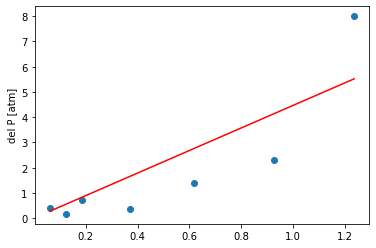

The absolute permeability tensor i.e. k = [0.22358913]


In [21]:
print("The absolute permeability tensor i.e. k =",(1/Lin_Reg(x,y)))

### EXERCISE 2

In [22]:
class RadialDiffusivityEquationSolver:
    """
    A finite difference solver for the radial diffusivity equation.
    We use the coordinate transformation y = ln(r/rw) to set up and
    solve the pressure equation.
    The solver uses SI units internally, while "practical field units"
    are required as input.
    Except for the number of grid blocks / points to use, all class
    instance attributes are provided with reasonable default values.
    Input arguments:
        name                                symbol       unit
        --------------------------------------------------------------
        Number of grid points               N            dimensionless
        well radius                         rw           ft
        extent of reservoir                 re           ft
        height of reservoir                 h            ft
        permeability                        k            mD
        porosity                            phi          dimensionless
        fluid viscosity                     mu           mPas (cP)
        total compressibility               ct           1 / psi
        constant flow rate at well          Q            bbl / day
        initial reservoir pressure          pi           psi
        constant time step                  dt           days
        maximal simulation                  time         max_time days
        -------------------------------------------------------------
    """
    def __init__(self, N, rw=0.328, re = 100000., h=8.0,
        k=500, phi=0.1, mu=1.0, ct=17.7e-6,
        Q=1000, pi=2000, dt=0.1, max_time=10):
        # Unit conversion factors (input units --> SI)
        self.ft_to_m_ = 0.3048
        self.psi_to_pa_ = 6894.75729
        self.day_to_sec_ = 24*60*60
        self.bbl_to_m3_ = 0.1589873
        # Grid
        self.N_ = N
        self.rw_ = rw*self.ft_to_m_
        self.re_ = re*self.ft_to_m_
        self.h_ = h*self.ft_to_m_
        # Rock and fluid properties
        self.k_ = k*1e-15 / 1.01325
        self.phi_ = phi
        self.mu_ = mu*1e-3
        self.ct_ = ct / self.psi_to_pa_
        # Initial and boundary conditions
        self.Q_ = Q*self.bbl_to_m3_ / self.day_to_sec_
        self.pi_ = pi*self.psi_to_pa_
        # Time control for simulation
        self.dt_ = dt*self.day_to_sec_
        self.max_time_ = max_time*self.day_to_sec_
        self.current_time_ = 0.
        
        #r and y arrays for PART 4 - Problem 2
        #self.r_gridpoints_ = np.linspace(self.rw_,self.re_,self.N_) #Numpy array of radial distance from rw to re
        self.y_gridpoints_ = np.linspace(self.r2y(self.rw_),self.r2y(self.re_),self.N_+1) #Numpy array in y-coordinates derived from y_gridpoints
        self.y_midpoints_ = (self.y_gridpoints_[1:] + self.y_gridpoints_[:-1])/2 #Numpy array of mid points of above array
        self.time_hrs= (0.0001 + np.array([0,10,20,40,80,150,300,500,800,1200,1500,2000,2500,3000]))
        
    def line_source_solution(self,r,t,pi = None,k = None):
        
        """
        Returns the cauclated reservoir pressure at certain space and time.
        Inputs: 
        r = radial distance (meters)
        t = time (in days- converted to secs in the function)
        """
        if (pi==None):
            pi = self.pi_
        if (k==None):
            k=self.k_
        
        t = t*self.day_to_sec_
        eta= (self.k_)/(self.mu_*self.phi_*self.ct_)
        x = ((-1)*r**2)/(4*eta*t)
        pie = m.pi
        p_rt = pi+((self.Q_*self.mu_)/(4*pie*k*self.h_))*(special.expi(x))
        return p_rt
    
    def plot_line_source_solution(self,position_array,t = 10):
        
        """
        Return nothing, Plots Reservoir pressure against Radial Distance
        Input:
        r = radial distance
        t = time (days) (10 days by default, can be changed)
        """
        
        resv_pres=self.line_source_solution(position_array,t)
        plt.title("Reservoir Pressure vs Radial Distance")
        plt.xlabel('Radial Distance [m]')
        plt.ylabel('Reservoir Pressure [pa]')
        plt.plot(position_array,resv_pres)
        
    def r2y(self,r):
        """
        Takes "r" coordinates points as input argument
        Return "y" coordinates. 
        """
        return np.log(r/self.rw_)
        
    def y2r(self,y):
        """
        Takes "y" coordinates points as input argument
        Return "r" coordinates.
        """
        return self.rw_*np.exp(y)
    
    def discretize_plot(self):
        """
        Plots Reservoir Pressure vs Radial Distance (log scale) graph
        Radial Distance is derived from the mid points of each step n y-coordinates, this is in meters. 
        This simulation, is done for t = 10 days i.e. default maximum
        Returns x and ais arrays of the plot, first arrays contains pressures and second contains values of r(radial distances)
        """
        #print(self.r_gridpoints_)
        #print(self.y_gridpoints_)
        #print(self.y_midpoints_)
        r_mids=self.y2r(self.y_midpoints_)
        p_rt=self.line_source_solution(r_mids,self.max_time_)
        plt.title("Reservoir Pressure vs Radial Distance (log)")
        plt.xlabel('Radial Distance [m] [LOG SCALE]')
        plt.ylabel('Reservoir Pressure [psi]')
        plt.xscale('log')
        plt.plot(r_mids,p_rt)
        return p_rt,r_mids
    
    def setup_matrix(self,N,dt=0.1):
        
        """
        Sets up the constants required to populate the matrx of coefficients i.e. beta_ and E_i_ (epsilon)
        
        return matrix A (NxN) filled with zeros, E_i_ and beta_, deta y (step size in y domain) and y values.
        
        Input: N = Number of grid points
        dt: time step
        
        """
        
        #Converting days to secs. 
        dt=dt*self.day_to_sec_
        
        #Computing yi or named as y_pts here
        y_gridpoints_ = np.linspace(self.r2y(self.rw_),self.r2y(self.re_),N+1) #gridpoints
        #y_pts = np.hstack((y_gridpoints_[0],((y_gridpoints_[1:] + y_gridpoints_[:-1]) / 2))) #midpoints
        
        y_pts = (y_gridpoints_[1:] + y_gridpoints_[:-1]) / 2
        delt_y= y_gridpoints_[1]-y_gridpoints_[0] 
        
        #eta constant used in epslon
        eta_= (self.k_)/(self.mu_*self.phi_*self.ct_)
        
        # Beta constant
        beta_ = (self.Q_*self.mu_*delt_y)/(2*m.pi*self.k_*self.h_) 
        #epselon
        E_i_ = (eta_*np.exp(-2*y_pts)*dt)/((self.rw_**2)*delt_y**2)
        A_mat_ = np.zeros((N,N))
        
        #print(y_gridpoints_)
        #print(y_pts)
        #print(delt_y)
        return beta_, E_i_, A_mat_,delt_y,y_pts
    
    def setup_sparse_mat(self,N,dt=0.1):
        
        """
        Populates the matrx of coefficients A with variables calculated in setup_matrix(N) i.e.E_i_ (epsilon)
        
        return matrix A (NxN) filled with the appropriate values of E_i, array of E_i and beta
        Also returns non-zero elements of A, principle_diagonal_,below_diagonal_,up_diagonal_ 
        
        Input: N = Number of grid points
        dt: time step
        
        """
        
        b,eps_i,arr,dy,y = self.setup_matrix(N,dt)
        
        up_diagonal_ =(-1)*eps_i[:-1] #from eps_0 to eps_N-1, mulitplied by -1
         
        below_diagonal_ =(-1)*eps_i[1:] #from eps_1 to eps_N, multiplied by -1
        
        principle_diagonal_ =[0]*(N)
        principle_diagonal_[-1]= 1+eps_i[-1]
        principle_diagonal_[0]= 1+eps_i[0]
        principle_diagonal_[1:-1]= 1+2*eps_i[1:-1]
        
        diagonals = [principle_diagonal_,below_diagonal_,up_diagonal_]
        
        arr=diags(diagonals, [0, -1, 1]).toarray()
        
        return b,eps_i,arr,principle_diagonal_,below_diagonal_,up_diagonal_
    
    def rhs(self,N,dt=0.1,pi=None,k=None):
        """
        We need to calculate the RHS of equation 25. We know delta t to be a constant, we know delta y as well
        To compute p(y+delta-y,delta_t) we can use line_source_solution
        
        Input: 
        dt = Time stamp at which to be calculated. 
        N = number of samples
        
        Returns RHS of Equation 25
        """
        
        
        if (pi==None):
            pi = self.pi_
        if (k==None):
            k=self.k_
            
            
        #This is an array for all values of p at all y's for time = dt
        p_at_deltaT = np.zeros(N)
        
        position_array_y = self.setup_matrix(N)[4]  #midpoints
        positon_array_r = self.y2r(position_array_y)  #midpoints of y -> r
        
        delta_y = position_array_y[1]-position_array[0]
        
        #calculate p, no that we have constructed the position array in r and we know dt
        p_at_deltaT=self.line_source_solution(positon_array_r,dt,pi,k)
       
        #Get beta and epsilon
        beta=self.setup_matrix(N,dt)[0]
        E_i=self.setup_matrix(N,dt)[1]
        
        d = np.zeros(N)
        d[0] = (-1)*beta*E_i[0]
        
        rhs=p_at_deltaT+d
        
        return rhs,positon_array_r,p_at_deltaT[0]


    def toplevel_(self,rhs_,N=100,dt = 0.1):
        
        """
        
        This function is the toplevel function, It gives user choice to your sparse or dense solver for the system of equations. 
        It computes the coefficient matrix A and calculates the p_n+1.
        
        It takes rhs_, which is the numpy array as input. This array corresponds to the result of the RHS of equation 25.
        
        """
        #We only need to compute this once as dt is not varying
        A = self.setup_sparse_mat(N,dt)[2]
        
        #rhs_ = self.rhs(N,time_steps,dt)
        #print(A.shape)
        #print(rhs_.shape)

        
        choice = input ("1 = SPARSE SOLVER, and 0 = DENSE SOLVER")
        
        if (choice == '1'):
            A = csc_matrix(A,dtype =float)
            #B = #csc_matrix(rhs_)
            #print(A.shape)
            #print(rhs_.shape)
            p_n_plus1 = spsolve(A, rhs_) #At t=t+delta_t
        elif (choice == '0'):
            p_n_plus1 = linalg.solve(A, rhs_) #At t = t+delta_t
            
        else:
            p_n_plus1=np.zeros(N)
            print("INVALID INPUT")
        
        return p_n_plus1
    
    def P_well_arrar_FiniteD_Est(self,N=100,hours_arr=(0.0001 + np.array([0,10,20,40,80,150,300,500,800,1200,1500,2000,2500,3000])),pi=None,k=None,plot = True):
        
        """
        This functions estimates the Well pressure using finite difference estimation. 
        Inputs:
        
        N = number of steps of discretization.
        hours_arr = time array containing time in hours, the default value is set according the WELL TEST DATA.
        plot = TRUE or FALSE depending upon upon you want to see the plots or not.
        
        
        A 0.0001 is added in the default value of hours_arr to avoid division by zero. 
        
        """
        
        
        if (pi==None):
            pi = self.pi_
        if (k==None):
            k=self.k_
        if (hours_arr.all() == None):
            hours_arr= self.time_hrs
        
        #print("Shape of dt array",hours_arr.shape)
         

        p_well_list=[]
        for hours in hours_arr:
            dt = hours/24 #DAYS
            #First compute RHS , We use 2N because we want to half the delta_y
            rhs = self.rhs(N,dt,pi,k)[0]

            #Second compute the coeficient matrix for N = 100
            A = self.setup_sparse_mat(N,dt)[2]
            A = csc_matrix(A,dtype =float)
            p_i = spsolve(A, rhs)
            _beta = self.setup_sparse_mat(N,dt)[0] 
            p_well = p_i[0] - (_beta/2)
            p_well = p_well/6894.75729                         #Conversion from pa to psi                 
            p_well_list.append(p_well)

        p_well_arr = np.array(p_well_list)
        #print("Shape of 'Well Pressure' (p_well_arr) array",p_well_arr.shape)
        #print("Peeking at first value to check consistency with Part 2 solution:  ",p_well_arr[0])
        if (plot):                                             # If plot is true only then this function plots.
            plt.plot(hours_arr,p_well_arr)                     
            plt.title('Well Pressure vs Time [ESTIMATED]')
            plt.xlabel('Time [hours]')
            plt.xscale('log')
            plt.ylabel('Well pressure [psi]')
            plt.show()
        return p_well_arr,hours_arr
        

        
        
        
        
        
    

#### PART 1

We are just going to paste a snap of the Part 1 here to keep an eye on the equation.

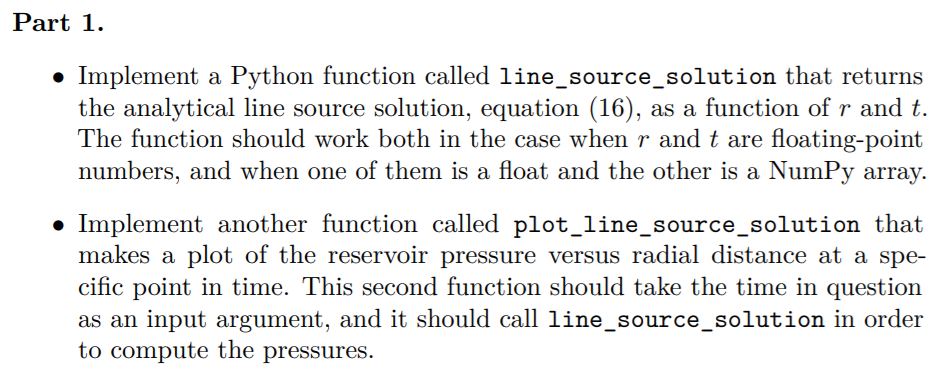

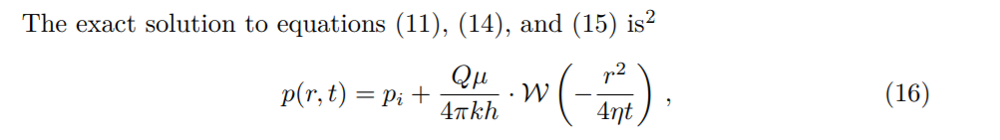


In [23]:
# Create our first solver object. Use only default arguments:
solver = RadialDiffusivityEquationSolver(N=100)

# We are going to calculate the analytical solution at a specific point in  space and time:
#We are going to calculate for the following input parameters.

#Radial distance = 10.0
#Time = 42

analytical_sol = solver.line_source_solution(10.0, 42.0)
analytical_sol

12333797.803655365

In [24]:
#Or at a specific position, but at several times:


#Radial distance = 10.0
#Time = 0.1 to 50 days

time_array = np.linspace(0.1, 50, 51)
analytical_sol = solver.line_source_solution(10.0, time_array)
analytical_sol

array([13068697.03230189, 12777267.86796262, 12698593.67058912,
       12651203.47500065, 12617182.15068798, 12590623.35299611,
       12568835.06348152, 12550361.68792249, 12534326.48270517,
       12520160.25197845, 12507472.44693048, 12495983.43658694,
       12485486.11488004, 12475822.80426978, 12466870.67929207,
       12458532.19634792, 12450728.59843775, 12443395.38050316,
       12436479.04545432, 12429934.73368963, 12423724.45823046,
       12417815.76879365, 12412180.72547936, 12406795.09976748,
       12401637.74496293, 12396690.09471597, 12391935.75956957,
       12387360.19940231, 12382950.45525349, 12378694.92806308,
       12374583.19480945, 12370605.85470733, 12366754.3997544 ,
       12363021.1051427 , 12359398.93598552, 12355881.46752902,
       12352462.81657467, 12349137.58227401, 12345900.79479923,
       12342747.87066506, 12339674.57369369, 12336676.98078844,
       12333751.45182246, 12330894.60306258, 12328103.28364175,
       12325374.55466979, 12322705.67063

In [25]:
#Or at a specific time, but at multiple locations:

#Radial distance = 0.1 to 10 meters
#Time = 7 days

position_array = np.linspace(0.1, 10, 11)
analytical_sol = solver.line_source_solution(position_array, 7.0)
analytical_sol

array([11430977.92404328, 12012389.24488624, 12169668.20186514,
       12264423.83960117, 12332453.69122963, 12385563.38363691,
       12429134.52186073, 12466077.23241834, 12498144.46497468,
       12526474.30994284, 12551847.68297173])

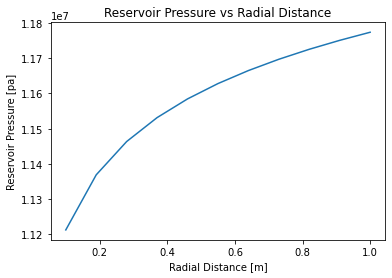

In [26]:
#Plotting the analytical solution against varying radial distance but at a constant time stamp (day)

#Radial distance = 0.1 to 1 meters
#Time = 42 days

position_array = np.linspace(0.1, 1, 11)
analytical_sol_plot = solver.plot_line_source_solution(position_array,42.0)   #Another function in class for plotting

#### PART 2

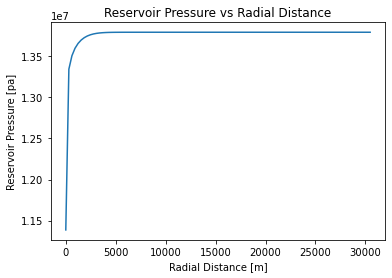

In [27]:
#We plot from rw (well radius) to re (a faar off point, where no fluid is flowing)

#Radial distance = rw to re (1000 samples)
#Time = 10 days (max_time )

position_array = np.linspace(solver.rw_,solver.re_, 100)
analytical_sol_plot = solver.plot_line_source_solution(position_array,10.0)

Yes we can obsrve that the slope of the plot has decreased and it has falttened out.

#### PART 3

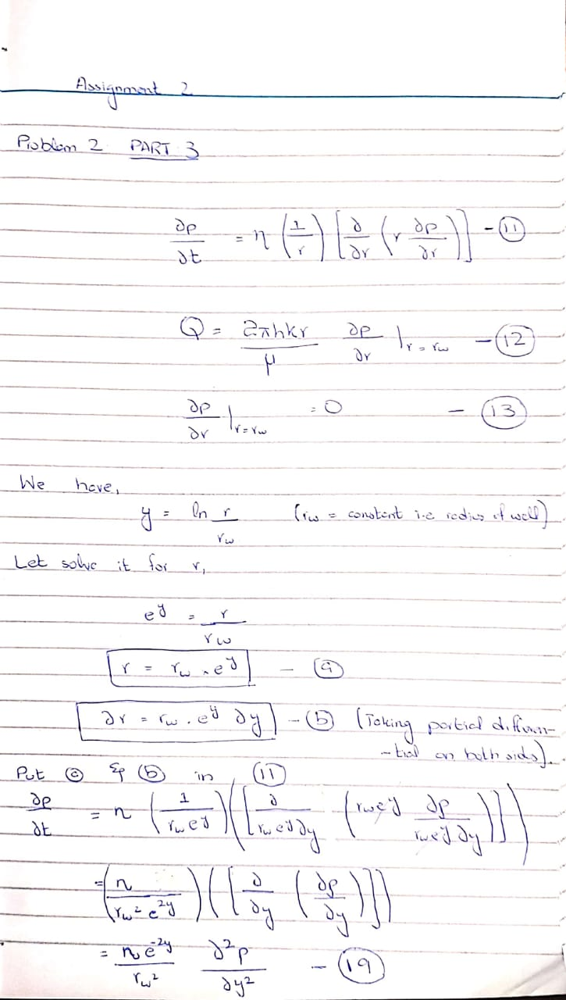

**We can see that Equation 11, after replacing r with y, simplifies into Equation 19.**

**We can do the same for the Equations 12 and 13**

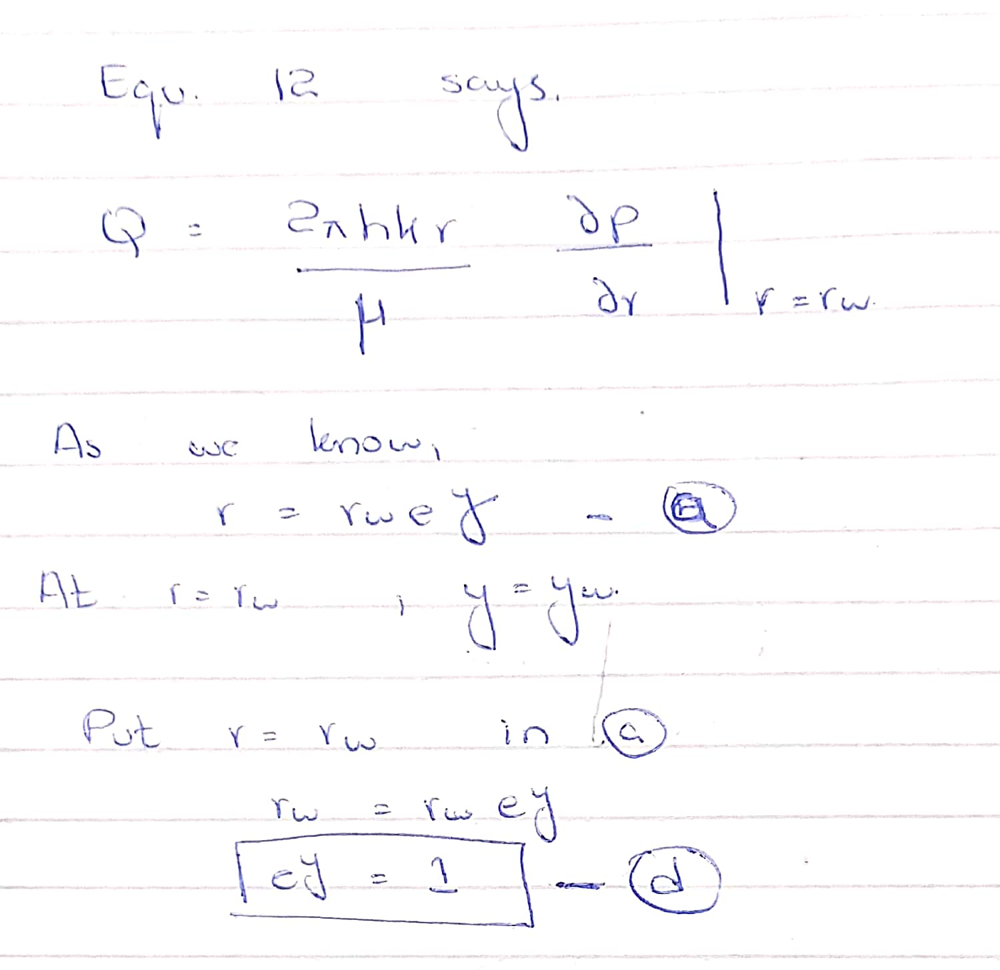

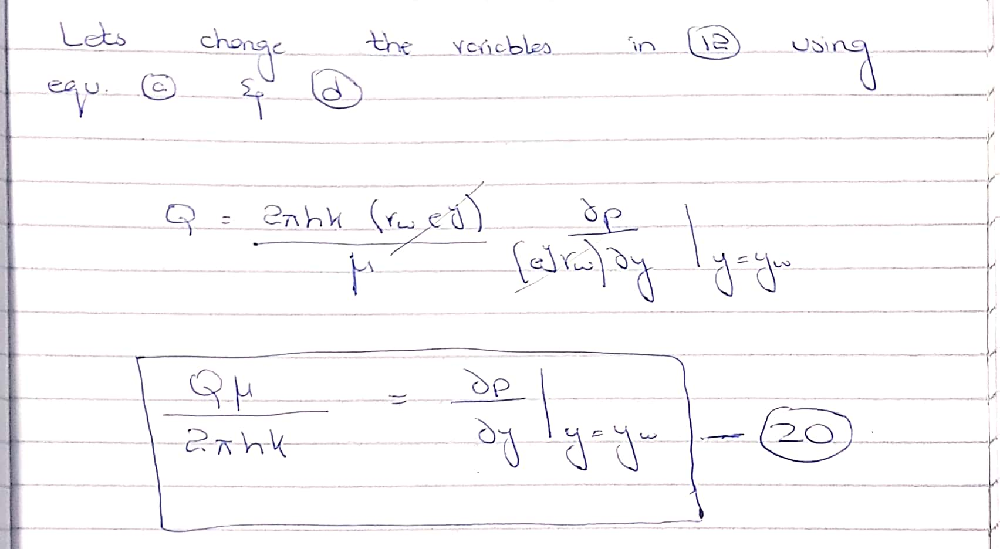

**And now for Equation 13**

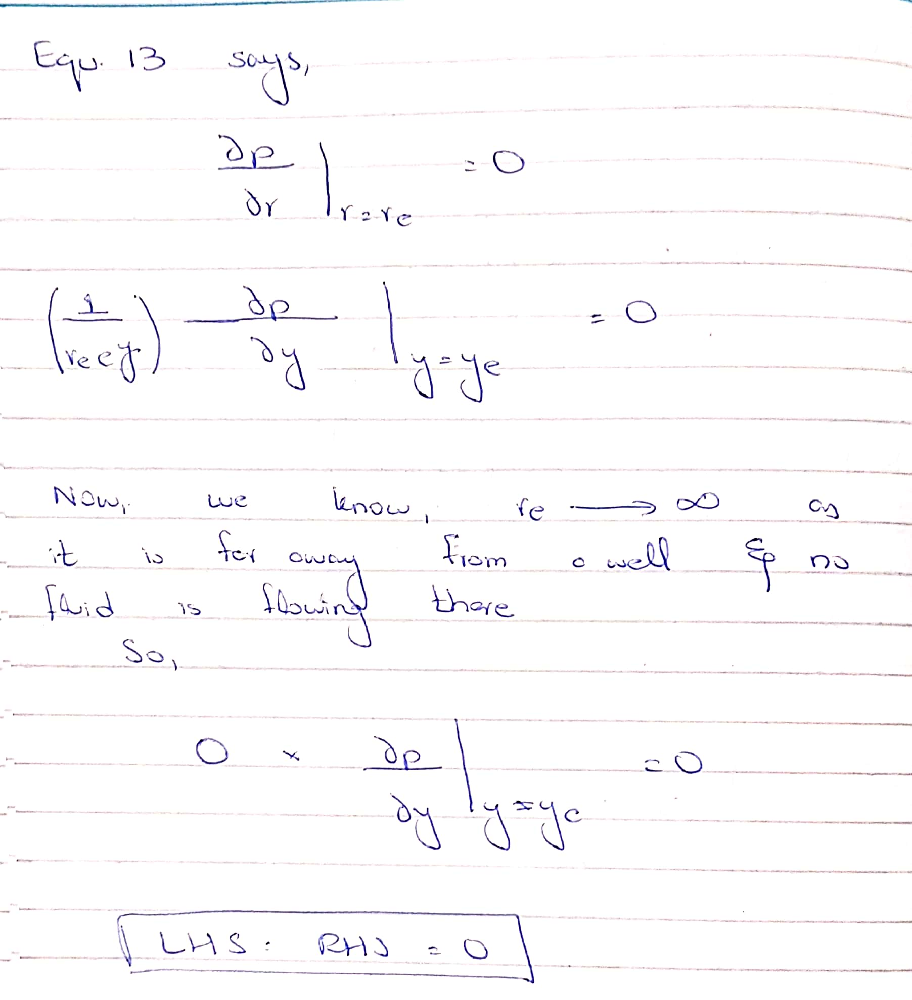

#### PART 4

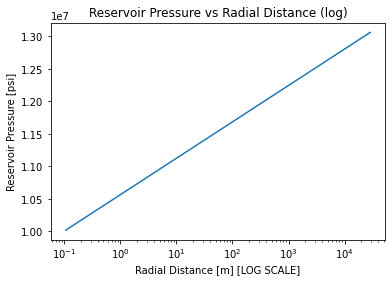

In [28]:
#solver was defined in the begining of this exercise 
Discretized_=solver.discretize_plot()  #Just to recall solver is an instance and discrete plot is defined in the class. 

In order to comment on the step size of "r", lets plot a non logarithmic form and also a plot of the differences between successive steps using numpy.diff function

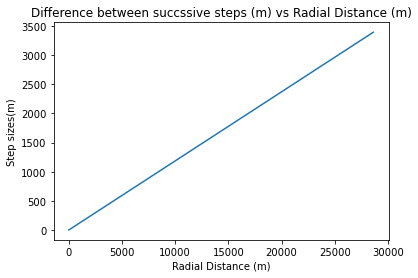

In [67]:
plt.title("Difference between succssive steps (m) vs Radial Distance (m)")
plt.xlabel("Radial Distance (m)")
plt.ylabel("Step sizes(m)")
plt.plot(Discretized_[1][1:],np.diff(Discretized_[1]))
plt.show()

Lets make a scatter plot to further clarify the change in step size 

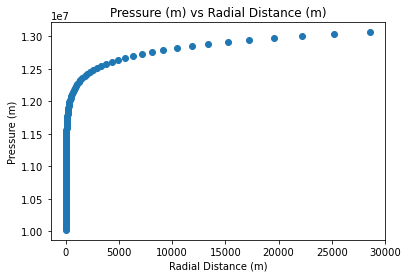

In [69]:
plt.title("Pressure (m) vs Radial Distance (m)")
plt.xlabel("Radial Distance (m)")
plt.ylabel("Pressure (m)")
plt.scatter(Discretized_[1],Discretized_[0])
plt.show()

We can see as the behaviour of the function starts to change, the step size also reduces, and once the function flattens out it starts to increase.Hence it seems to be adaptive to the function behaviour. 

#### PART 5

Following expressions can be written for i = 0,1,2,3 and N = 4

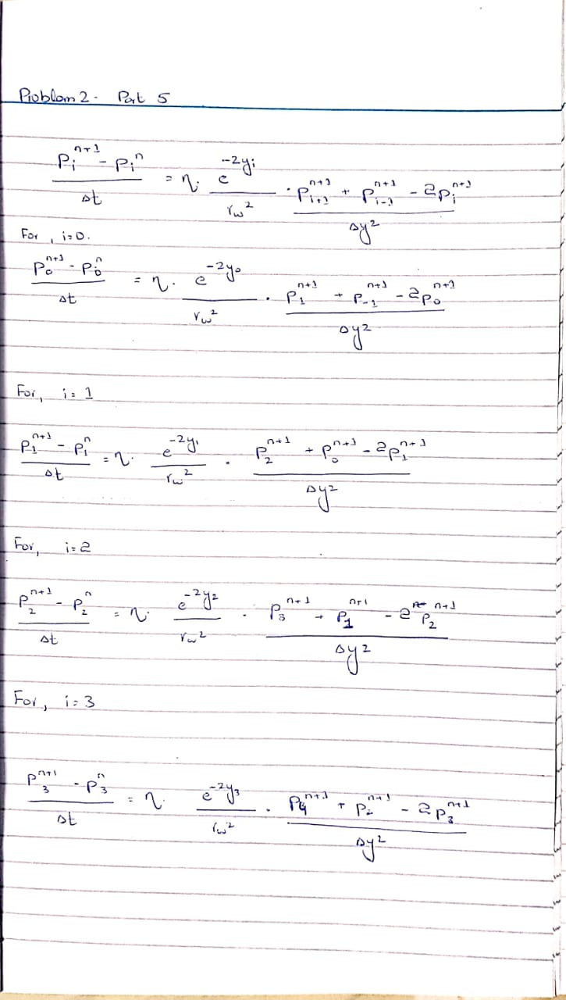

#### PART 6

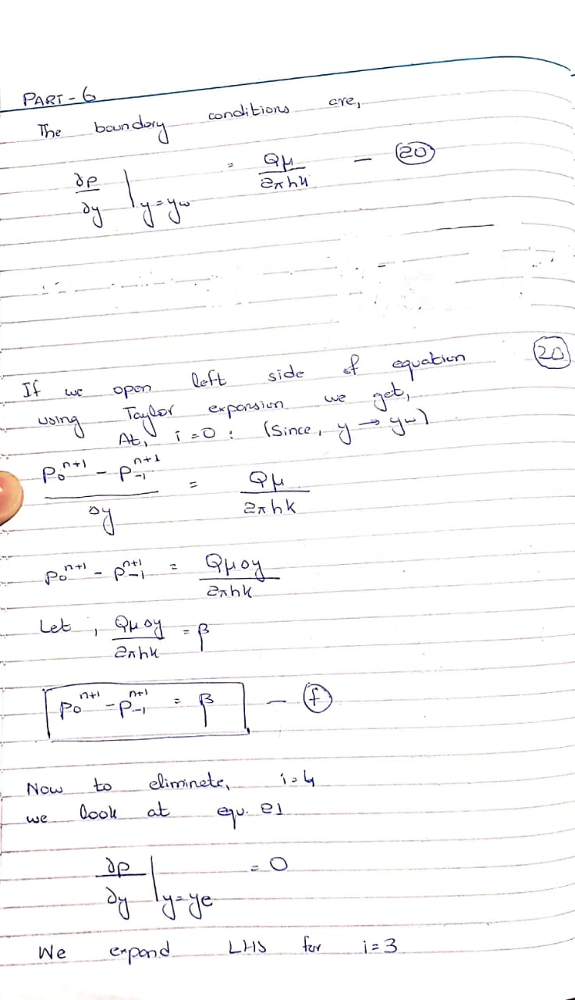

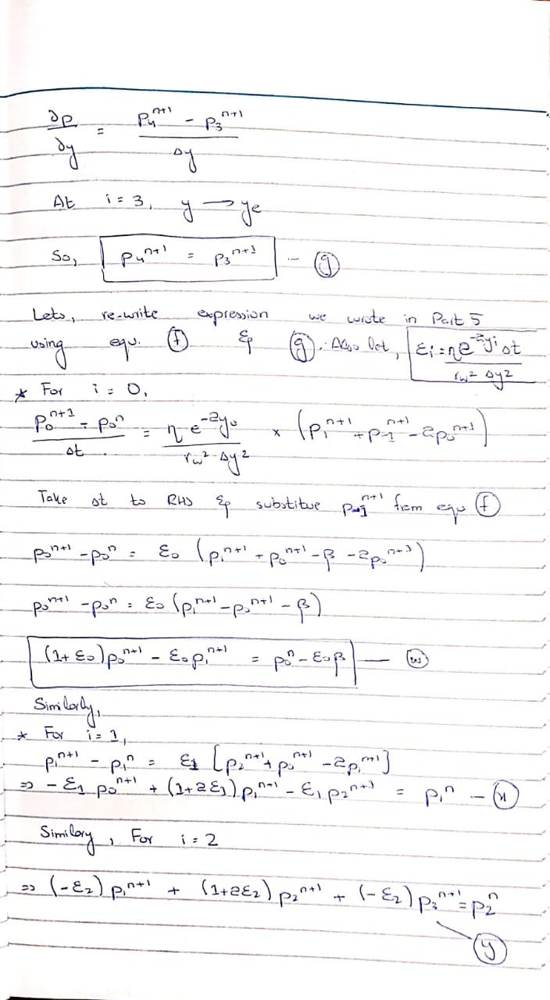

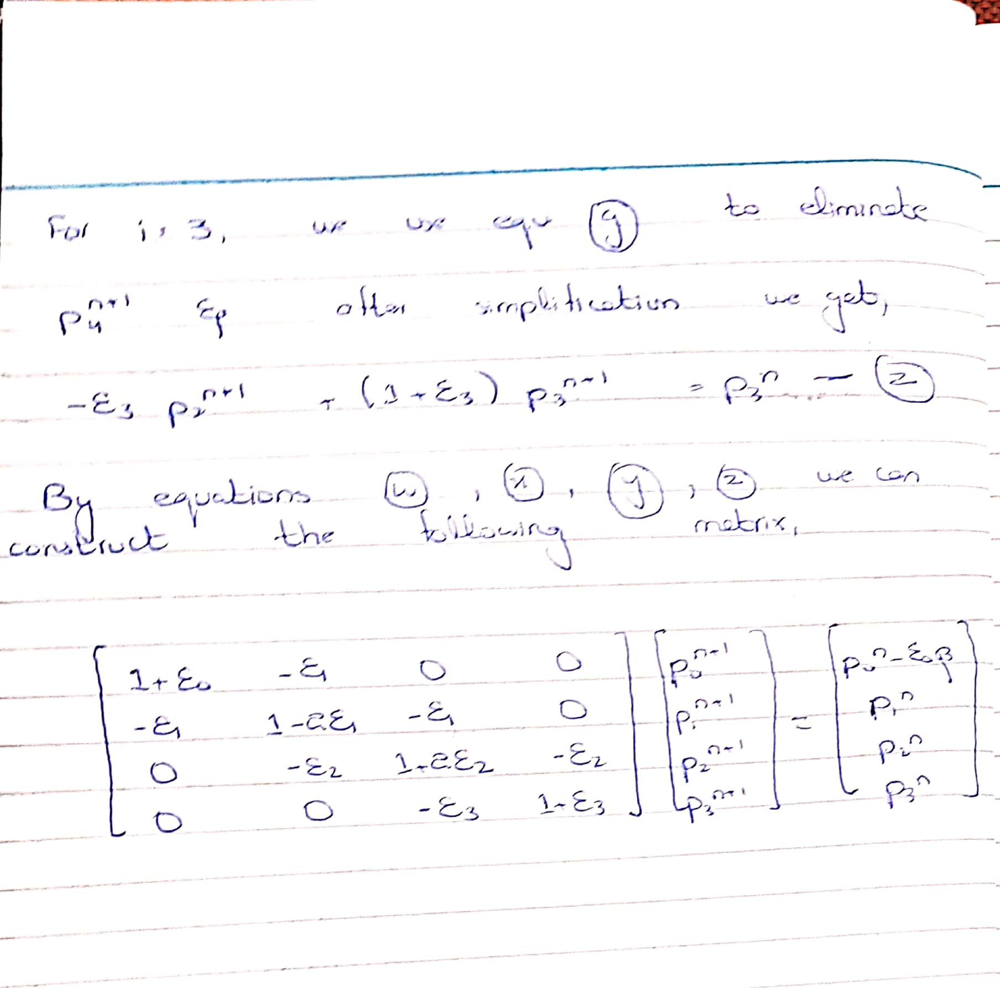

### Exercise 3 

#### PART 1

We will be using the same class as in Execise 2, we have added the required functions in it, we will make new instances of classes when we feel they are required.

Setting up matrix A, using setup_matrix(N)

In [31]:
solver2 = RadialDiffusivityEquationSolver(N=100)
b,e,arr,dy,y_m = solver2.setup_matrix(4)

#Printing out beta, espilon and empty array A, of the appropriate size i.e. NxN
print("Beta:",b)  
print("Epsilon_i",e)
print("A matrix (empty / not populated yet)","\n",arr)
print("Delta y is:",dy)

Beta: 768375.6891715231
Epsilon_i [7.09540894e+03 1.28503321e+01 2.32729413e-02 4.21490894e-05]
A matrix (empty / not populated yet) 
 [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
Delta y is: 3.1569167838920555


Setting up matrix A, using setup_sparse_mat(N), and filling up values as shown in the handout, also scheme is shown below for N =4

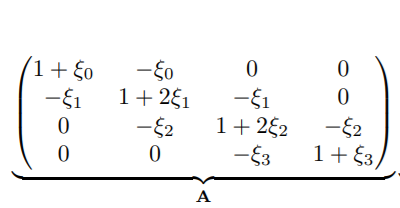

In [32]:
b,e,arr,p,b_p,u_p = solver2.setup_sparse_mat(4) 

print("Principle Diagonal is: ",p)
print("Below Diagonal is: ",b_p)
print("Upper Diagonal is: ",u_p) 
        
print("MATRIX A is: ","\n",arr)

Principle Diagonal is:  [7096.408938819879, 26.70066426143876, 1.0465458826386584, 1.0000421490893887]
Below Diagonal is:  [-1.28503321e+01 -2.32729413e-02 -4.21490894e-05]
Upper Diagonal is:  [-7.09540894e+03 -1.28503321e+01 -2.32729413e-02]
MATRIX A is:  
 [[ 7.09640894e+03 -7.09540894e+03  0.00000000e+00  0.00000000e+00]
 [-1.28503321e+01  2.67006643e+01 -1.28503321e+01  0.00000000e+00]
 [ 0.00000000e+00 -2.32729413e-02  1.04654588e+00 -2.32729413e-02]
 [ 0.00000000e+00  0.00000000e+00 -4.21490894e-05  1.00004215e+00]]


Now we set up the RHS i.e. p^n, lets look at the (25) for reference  

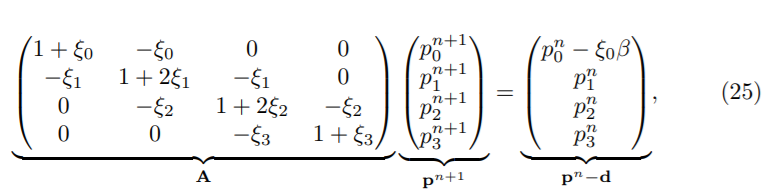

In [33]:
print("The RHS for N =4 is,","\n",solver2.rhs(4)[0])

The RHS for N =4 is, 
 [-5.43960760e+09  1.31002715e+07  1.37660471e+07  1.37895146e+07]


#### PART 2

We want to make a generalized TOP-LEVEL function which executes the processes of PART 1 and solves the equation after user input, regarding "scipy.linalg.solve" or "scipy.sparse.linalg". 

For solving the matrix expression AX = B, "scipy.sparse.linalg" assumes the resulting matrix X is sparse, as is often the case for very sparse inputs. If the resulting X is dense, the construction of this sparse result will be relatively expensive. In that case, consider converting A to a dense matrix and using scipy.linalg.solve or its variants.

In [70]:
N=100
#First compute RHS 
rhs_ = solver2.rhs(N)[0]

#Bring the x-coordinates for the plot
r_coordinates = solver2.rhs(N)[1]

#First one for sparse ; PRESS 1 when provoked
pn1_sparse=solver2.toplevel_(rhs_,N)

#SECOND ONE for dense: PRESS 2 when provoked
pn1_dense=solver2.toplevel_(rhs_,N)


1 = SPARSE SOLVER, and 0 = DENSE SOLVER1
1 = SPARSE SOLVER, and 0 = DENSE SOLVER1


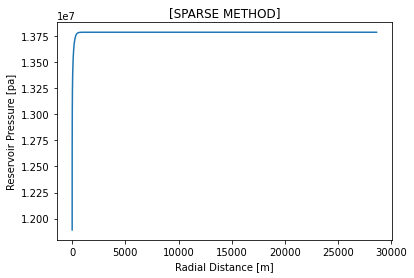

In [71]:
#Using sparse method
plt.title("[SPARSE METHOD]")
plt.xlabel('Radial Distance [m]')
plt.ylabel('Reservoir Pressure [pa]')
plt.plot(r_coordinates,pn1_sparse)
plt.show()

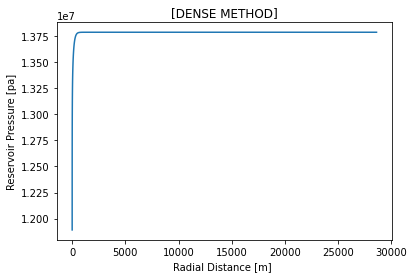

In [72]:
#Using dense method
plt.title("[DENSE METHOD]")
plt.xlabel('Radial Distance [m] ')
plt.ylabel('Reservoir Pressure [pa]')
plt.plot(r_coordinates,pn1_dense)
plt.show()

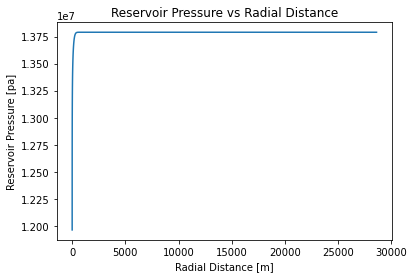

In [39]:
#Analtical Soltution
dt = 0.1
t=dt
solver2.plot_line_source_solution(r_coordinates, t)

We can safely conclude from the above plots that we get same answers whether we use "Sparse" or "Dense" methods, and the results are very much similar to the Analytical solution.

#### PART 3

We are going to compare the efficiency of the two numerical schemes, using timeit() function now, we can test this by making local functions instead of messing up our class function  

In [40]:
N=1000
dt=0.1
#First compute RHS 
rhs_ = solver2.rhs(N)[0]
A = solver2.setup_sparse_mat(N)[2]

print("A matrix for N=1000 looks like this",A)
def sparse(A,rhs):
    A = csc_matrix(A,dtype =float)
    return spsolve(A, rhs)
def dense(A,rhs):
    return linalg.solve(A, rhs)

A matrix for N=1000 looks like this [[ 1.02897509e+10 -1.02897509e+10  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-1.00331339e+10  2.00662678e+10 -1.00331339e+10 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00 -9.78291672e+09  1.95658334e+10 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 ...
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  1.23882913e+00
  -1.19414566e-01  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ... -1.16436476e-01
   1.23287295e+00 -1.16436476e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
  -1.13532657e-01  1.11353266e+00]]


In [41]:
start = timeit.default_timer()

x=sparse(A,rhs_)

stop = timeit.default_timer()

print('Time taken during sparse approach: ', stop - start)

Time taken during sparse approach:  0.06921373600005154


In [42]:
start = timeit.default_timer()

x=dense(A,rhs_)

stop = timeit.default_timer()

print('Time taken during dense approach: ', stop - start) 

Time taken during dense approach:  0.7310650849999547


We can see that the sparse method is faster. 

### EXERCISE 4

#### PART 1

We will be using dat2pandas function to read the dat file to pandas data frame, we defned it in EXERCISE 1 

In [73]:
df3 = dat2pandas("well_test.dat",n=3)

In [74]:
arr2 = df3.to_numpy()
print(arr2)

Well_pressure = arr2[:,1]
time_hrs=arr2[:,0]

[[  10 1849]
 [  20 1784]
 [  40 1726]
 [  80 1661]
 [ 150 1595]
 [ 300 1508]
 [ 500 1421]
 [ 800 1320]
 [1200 1211]
 [1500 1131]
 [2000  986]
 [2500  856]
 [3000  718]]


In [75]:
#Well_pressure = np.array([1900,1849,1784,1726,1661,1595,1508,1421,1320,1211,1131,986,856,718])
#time_hrs=np.array([0,10,20,40,80,150,300,500,800,1200,1500,2000,2500,3000])

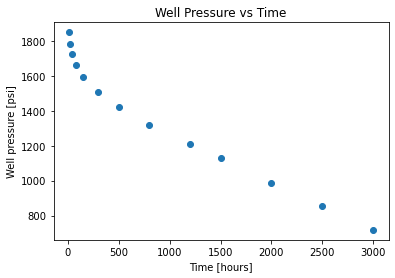

In [76]:
plt.scatter(time_hrs,Well_pressure)
plt.title('Well Pressure vs Time')
plt.xlabel('Time [hours]')
plt.ylabel('Well pressure [psi]')
plt.show()

#### PART 2

We derived the relation for well pressure by the following steps, using EQUATION 20 for the RHS of finite different equation

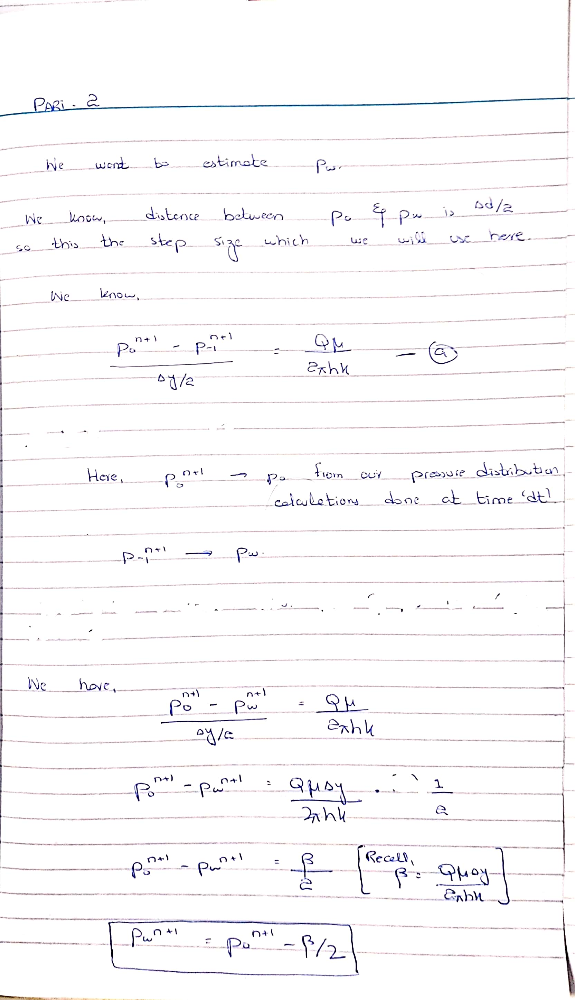

In [47]:
solver3 = RadialDiffusivityEquationSolver(N=100)

#Default Inputs
N=100
hours = 0.0001  # A time very close to zero 
dt = hours/24 #DAYS

#First compute RHS , We use 2N because we want to half the delta_y
rhs = solver3.rhs(N,dt)[0]

#Second compute the coeficient matrix for N = 100
A = solver3.setup_sparse_mat(N,dt)[2]
A = csc_matrix(A,dtype =float)

p_i = spsolve(A, rhs)
_beta = solver3.setup_sparse_mat(N,dt)[0] 
p_well = p_i[0] - (_beta/2)
p_well = p_well/6894.75729
print(p_well)

1900.170564179947


In [48]:
print("Numerically calculated Well Pressure at time very close to 0 hours (at 0.0001/24 = 4.1667e-6 hours) is ",p_well, "psi")

Numerically calculated Well Pressure at time very close to 0 hours (at 0.0001/24 = 4.1667e-6 hours) is  1900.170564179947 psi


#### PART 3

Now we will extend the above code to calculate the Well Pressure over a certain range of time, and we will use a class function

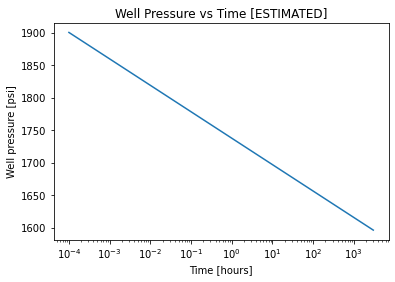

In [49]:
hours=np.arange(0.0001,3000,1)
p_well_arr=solver3.P_well_arrar_FiniteD_Est(hours_arr=hours)[0]

We can see the above plot made for 3000 hours for the values of Well Pressure. 

#### PART 4

We have to manually match the numerical model to the well test data. We have to modify one or both of the following
input parameters: k, pi. 

At the end, we will make a plot in which we show,

1) the experimental well test data 

2) numerical well pressure solution 

3) the corresponding line source solution

We start by making an instance of the class named as solver4

In [50]:
solver4=RadialDiffusivityEquationSolver(N=100)

The function below, takes in arguments of an instance of class, well pressure and n (length of the time array). This function uses LEAST SQUARE OPTIMIZATION to find the optimal values of pi and k at a given hour in test data. Also note n<=13, as we only have 14 datapoints of well data. 

In [77]:
def Optimizer_(Well_pressure,example_self,n):
    """
    Inputs:
    
    Well_pressure : This is taken from the given dataset
    example_self  : This is an instance of the class RadialDiffusivityEquationSolver
    n             : This is the length of hours_arr (max value = 14 for curent scope, as dataset has 14 points only)
    
    Outputs: 
    _pi  : Initial Pressure in psi
    _k   : Value of permeability
    """
    x=np.array([2000,500])  #INITIAL GUESS
    _pi =[] 
    _k=[]
    i=0
    while (i<n):
        def opt(x):
            
            example_self=RadialDiffusivityEquationSolver(N=100,pi = x[0],k = x[1])
            p_well_arr=example_self.P_well_arrar_FiniteD_Est(plot =False)[0]
            diff = np.abs(Well_pressure[i]-p_well_arr[i])
            return diff
        res= least_squares(opt, x) 
        i=i+1
        _pi.append(res.x[0])
        _k.append(res.x[1])
    return _pi,_k

In [82]:
Optimized_Inputs = Optimizer_(Well_pressure,solver4,n=time_hrs.size)

In 64bit anaconda version, the function call generates a warning because the int in np array carry 32 bits, and somewhere optimizer overflows this. However, it works fine with 32bit anaconda version.

In [83]:
#Unpacking the tuple
pi_opt = Optimized_Inputs[0]
k_opt = Optimized_Inputs[1]

We are going to calculate the well pressure at the given times (corresponding to the well data), using optimized pi's and k's for each point. We will store this result in a list i.e."p_well_matched". 

In [84]:
p_well_matched_est=[]
i=0
for i in range (time_hrs.size):
    solver4=RadialDiffusivityEquationSolver(N=100,pi = pi_opt[i],k = k_opt[i])
    p_well_m = solver4.P_well_arrar_FiniteD_Est(plot =False)[0]
    p_well_matched_est.append(p_well_m[i])

We are going to do the same for the line source solution.

In [85]:
p_well_matched_line=[]
i=0
for i in range (time_hrs.size):
    solver4=RadialDiffusivityEquationSolver(N=100,pi = pi_opt[i],k = k_opt[i])
    p_well_l = solver4.line_source_solution(r=solver4.rw_,t=solver4.time_hrs/24) #line source function is expecting days
    p_well_matched_line.append(p_well_l[i]/6894.75729)    #conversion to psi

Lets make a plot of the results. 

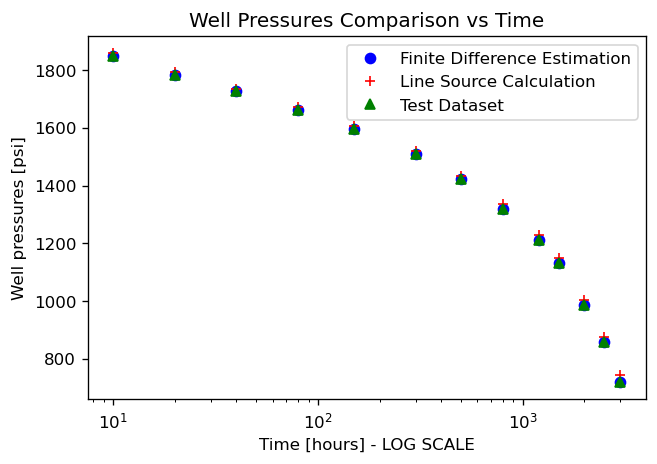

In [98]:
plt.figure(dpi=120)
plt.plot(time_hrs,p_well_matched_est,'bo',label = 'Finite Difference Estimation')
plt.plot(time_hrs,p_well_matched_line,'r+',label = 'Line Source Calculation')
plt.plot(time_hrs,Well_pressure,'g^',label = 'Test Dataset')
plt.title('Well Pressures Comparison vs Time')
plt.xlabel('Time [hours] - LOG SCALE')
plt.xscale('log')
plt.ylabel('Well pressures [psi]')
plt.legend()
plt.show()

We can see above that we have successfully matched our results with the test data by optimizing the value of Initial Pressure (pi) and Permeability (k)

### PART 5 

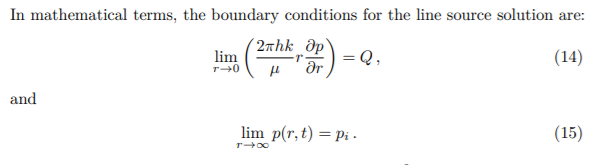

We can see from the equations above, that when r -> inf, pressure of reservor = P_i, this is the point where we will caclculate r because to corresponds to re. We start with a initial guess of re = 5000 (named as x here).

We will use the values of Pi and k, where the drop in slope starts to begin, from the scatter plot above we infer this to be at index equals -6.

In [90]:
#Lets fetch all the input arguments
Press_Init = pi_opt[-6]
K_Perm =k_opt[-6]
_t = time_hrs[-6]

We want to find the value of r at which pressure is equal to Press_Init

In [93]:
x= 5000 #Giving default value of re as initial guess in meters. 
def opt(x):
            
    solver5=RadialDiffusivityEquationSolver(N=100,pi = Press_Init,k = K_Perm)
    p_end=solver5.line_source_solution(r=x,t=_t/24)
    p_end=p_end/6894.75729
    diff=np.abs(Press_Init-p_end)
    print(diff)
    return diff

res= least_squares(opt, x) 

[2.20714033]
[2.20714018]
[0.76990425]
[0.76990417]
[0.27026287]
[0.27026284]
[0.09542733]
[0.09542732]
[0.03385873]
[0.03385872]
[0.01206148]
[0.01206148]
[0.00431106]
[0.00431106]
[0.00154493]
[0.00154493]


In [94]:
print("re is estimated to be equal to: ", res.x, "meters")

re is estimated to be equal to:  [10946.45075448] meters


The volume of cylinder can be calculated as: π*(r^2)*h

In [95]:
solver6=RadialDiffusivityEquationSolver(N=100,pi = Press_Init,k = K_Perm)

In [96]:
Volume = (m.pi)*(res.x[0]**2)*solver6.h_

In [97]:
print("The volume of fluid is like ",Volume, "meter cube")

The volume of fluid is like  917912909.0258778 meter cube


### CONCLUSION

1. We can estimate model parameters by comparison with test data and make a our model a USEFUL MODEL.

2. We can solve complex equation by getting them into matrix form and using MATRIX SOLVERS.

3. Linear Regression can be used to fit data but it is affected by outliers.

4. Classes help alot in organizing the code. 